# PyORBIT output.mat comparison
06: Full simulation scan using measured tomo longitudinal distribution

In [1]:
import os
import glob
import imageio
import pickle
import pandas as pd
import numpy as np
import PyNAFF as pnf
import scipy.io as sio 
import matplotlib.cm as cm
from math import log10, floor
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from scipy.optimize import curve_fit

In [2]:
plt.rcParams['figure.figsize'] = [9.0, 8.0]
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 14

plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10

plt.rcParams['font.size'] = 10
plt.rcParams['legend.fontsize'] = 8

plt.rcParams['lines.linewidth'] = 1
plt.rcParams['lines.markersize'] = 5

In [3]:
def round_sig(x, sig=3):
        return round(x, sig-int(floor(log10(abs(x))))-1)

def replace_point_with_p(input_str):
        return input_str.replace(".", "p")
    
def is_non_zero_file(fpath):  
        print '\n\t\t\tis_non_zero_file:: Checking file ', fpath
        print '\n\t\t\tis_non_zero_file:: File exists = ', os.path.isfile(fpath)
        print '\n\t\t\tis_non_zero_file:: Size > 3 bytes = ', os.path.getsize(fpath)
        return os.path.isfile(fpath) and os.path.getsize(fpath) > 3

In [4]:
def add_input_file(dd, filename, label):
	f = filename
	p = dict()
	sio.loadmat(f, mdict=p)
	dd[label] = p	
	print '\tAdded output data from ', filename, '\t dictionary key: ', label
	return dd

In [5]:
def make_directory(path):
    try:
        os.mkdir(path)
    except OSError:
        print ("Creation of the directory %s failed" % path)
    else:
        print ("Successfully created the directory %s " % path)  

In [6]:
dd1 = dict() # NoSC H
dd2 = dict() # SC H
dd3 = dict() # NoSC V
dd4 = dict() # SC V

dd1 = add_input_file(dd1, '../05_Full_Simulation_Scan_BLonD/1_H_07/output/output.mat', '6.07')
dd1 = add_input_file(dd1, '../05_Full_Simulation_Scan_BLonD/1_H_08/output/output.mat', '6.08')
dd1 = add_input_file(dd1, '../05_Full_Simulation_Scan_BLonD/1_H_09/output/output.mat', '6.09')
dd1 = add_input_file(dd1, '../05_Full_Simulation_Scan_BLonD/1_H_10/output/output.mat', '6.10')
dd1 = add_input_file(dd1, '../05_Full_Simulation_Scan_BLonD/1_H_11/output/output.mat', '6.11')
dd1 = add_input_file(dd1, '../05_Full_Simulation_Scan_BLonD/1_H_12/output/output.mat', '6.12')
dd1 = add_input_file(dd1, '../05_Full_Simulation_Scan_BLonD/1_H_13/output/output.mat', '6.13')
dd1 = add_input_file(dd1, '../05_Full_Simulation_Scan_BLonD/1_H_14/output/output.mat', '6.14')
dd1 = add_input_file(dd1, '../05_Full_Simulation_Scan_BLonD/1_H_15/output/output.mat', '6.15')
dd1 = add_input_file(dd1, '../05_Full_Simulation_Scan_BLonD/1_H_16/output/output.mat', '6.16')
dd1 = add_input_file(dd1, '../05_Full_Simulation_Scan_BLonD/1_H_17/output/output.mat', '6.17')
dd1 = add_input_file(dd1, '../05_Full_Simulation_Scan_BLonD/1_H_18/output/output.mat', '6.18')
dd1 = add_input_file(dd1, '../05_Full_Simulation_Scan_BLonD/1_H_19/output/output.mat', '6.19')
dd1 = add_input_file(dd1, '../05_Full_Simulation_Scan_BLonD/1_H_20/output/output.mat', '6.20')
dd1 = add_input_file(dd1, '../05_Full_Simulation_Scan_BLonD/1_H_21/output/output.mat', '6.21')

dd2 = add_input_file(dd2, '1_H_07/output/output.mat', '6.07')
dd2 = add_input_file(dd2, '1_H_08/output/output.mat', '6.08')
dd2 = add_input_file(dd2, '1_H_09/output/output.mat', '6.09')
dd2 = add_input_file(dd2, '1_H_10/output/output.mat', '6.10')
dd2 = add_input_file(dd2, '1_H_11/output/output.mat', '6.11')
dd2 = add_input_file(dd2, '1_H_12/output/output.mat', '6.12')
dd2 = add_input_file(dd2, '1_H_13/output/output.mat', '6.13')
dd2 = add_input_file(dd2, '1_H_14/output/output.mat', '6.14')
dd2 = add_input_file(dd2, '1_H_15/output/output.mat', '6.15')
dd2 = add_input_file(dd2, '1_H_16/output/output.mat', '6.16')
dd2 = add_input_file(dd2, '1_H_17/output/output.mat', '6.17')
dd2 = add_input_file(dd2, '1_H_18/output/output.mat', '6.18')
dd2 = add_input_file(dd2, '1_H_19/output/output.mat', '6.19')
dd2 = add_input_file(dd2, '1_H_20/output/output.mat', '6.20')
dd2 = add_input_file(dd2, '1_H_21/output/output.mat', '6.21')

dd3 = add_input_file(dd3, '../05_Full_Simulation_Scan_BLonD/1_V_10/output/output.mat', '6.10')
dd3 = add_input_file(dd3, '../05_Full_Simulation_Scan_BLonD/1_V_11/output/output.mat', '6.11')
dd3 = add_input_file(dd3, '../05_Full_Simulation_Scan_BLonD/1_V_12/output/output.mat', '6.12')
dd3 = add_input_file(dd3, '../05_Full_Simulation_Scan_BLonD/1_V_13/output/output.mat', '6.13')
dd3 = add_input_file(dd3, '../05_Full_Simulation_Scan_BLonD/1_V_14/output/output.mat', '6.14')
dd3 = add_input_file(dd3, '../05_Full_Simulation_Scan_BLonD/1_V_15/output/output.mat', '6.15')
dd3 = add_input_file(dd3, '../05_Full_Simulation_Scan_BLonD/1_V_16/output/output.mat', '6.16')
dd3 = add_input_file(dd3, '../05_Full_Simulation_Scan_BLonD/1_V_17/output/output.mat', '6.17')
dd3 = add_input_file(dd3, '../05_Full_Simulation_Scan_BLonD/1_V_18/output/output.mat', '6.18')
dd3 = add_input_file(dd3, '../05_Full_Simulation_Scan_BLonD/1_V_19/output/output.mat', '6.19')
dd3 = add_input_file(dd3, '../05_Full_Simulation_Scan_BLonD/1_V_20/output/output.mat', '6.20')
dd3 = add_input_file(dd3, '../05_Full_Simulation_Scan_BLonD/1_V_21/output/output.mat', '6.21')
dd3 = add_input_file(dd3, '../05_Full_Simulation_Scan_BLonD/1_V_22/output/output.mat', '6.22')
dd3 = add_input_file(dd3, '../05_Full_Simulation_Scan_BLonD/1_V_23/output/output.mat', '6.23')
dd3 = add_input_file(dd3, '../05_Full_Simulation_Scan_BLonD/1_V_24/output/output.mat', '6.24')

dd4 = add_input_file(dd4, '1_V_10/output/output.mat', '6.10')
dd4 = add_input_file(dd4, '1_V_11/output/output.mat', '6.11')
dd4 = add_input_file(dd4, '1_V_12/output/output.mat', '6.12')
dd4 = add_input_file(dd4, '1_V_13/output/output.mat', '6.13')
dd4 = add_input_file(dd4, '1_V_14/output/output.mat', '6.14')
dd4 = add_input_file(dd4, '1_V_15/output/output.mat', '6.15')
dd4 = add_input_file(dd4, '1_V_16/output/output.mat', '6.16')
dd4 = add_input_file(dd4, '1_V_17/output/output.mat', '6.17')
dd4 = add_input_file(dd4, '1_V_18/output/output.mat', '6.18')
dd4 = add_input_file(dd4, '1_V_19/output/output.mat', '6.19')
dd4 = add_input_file(dd4, '1_V_20/output/output.mat', '6.20')
dd4 = add_input_file(dd4, '1_V_21/output/output.mat', '6.21')
dd4 = add_input_file(dd4, '1_V_22/output/output.mat', '6.22')
dd4 = add_input_file(dd4, '1_V_23/output/output.mat', '6.23')
dd4 = add_input_file(dd4, '1_V_24/output/output.mat', '6.24')


	Added output data from  ../05_Full_Simulation_Scan_BLonD/1_H_07/output/output.mat 	 dictionary key:  6.07
	Added output data from  ../05_Full_Simulation_Scan_BLonD/1_H_08/output/output.mat 	 dictionary key:  6.08
	Added output data from  ../05_Full_Simulation_Scan_BLonD/1_H_09/output/output.mat 	 dictionary key:  6.09
	Added output data from  ../05_Full_Simulation_Scan_BLonD/1_H_10/output/output.mat 	 dictionary key:  6.10
	Added output data from  ../05_Full_Simulation_Scan_BLonD/1_H_11/output/output.mat 	 dictionary key:  6.11
	Added output data from  ../05_Full_Simulation_Scan_BLonD/1_H_12/output/output.mat 	 dictionary key:  6.12
	Added output data from  ../05_Full_Simulation_Scan_BLonD/1_H_13/output/output.mat 	 dictionary key:  6.13
	Added output data from  ../05_Full_Simulation_Scan_BLonD/1_H_14/output/output.mat 	 dictionary key:  6.14
	Added output data from  ../05_Full_Simulation_Scan_BLonD/1_H_15/output/output.mat 	 dictionary key:  6.15
	Added output data from  ../05_Full_S

In [7]:
dd1['6.07'].keys()

['eps_z',
 'D_x',
 'D_y',
 'kurtosis_yp_6sig',
 'kurtosis_yp',
 'mu_yp',
 'kurtosis_z_6sig',
 'eff_beta_y',
 'eff_beta_x',
 'eff_alpha_y',
 'kurtosis_y_6sig',
 'epsn_y',
 'epsn_x',
 'beta_y',
 'beta_x',
 'dpp_rms',
 'sig_yp',
 'min_dE',
 'turn_time',
 'n_mp',
 'min_xp',
 'kurtosis_y',
 'kurtosis_xp_6sig',
 'alpha_x',
 'alpha_y',
 'bunchlength',
 '__header__',
 'sig_xp',
 'kurtosis_dE_6sig',
 'max_xp',
 'intensity',
 'min_yp',
 'sig_dE',
 'min_x',
 'min_y',
 'mu_y',
 'mu_x',
 'cumulative_time',
 'mean_yp',
 'kurtosis_xp',
 'eff_epsn_y',
 'eff_epsn_x',
 'mean_x',
 'mean_y',
 'mean_z',
 'kurtosis_x_6sig',
 '__version__',
 'max_z',
 'mu_dE',
 'max_x',
 'max_y',
 'mean_dE',
 'sig_z',
 'sig_y',
 'sig_x',
 'max_yp',
 'kurtosis_z',
 'eff_alpha_x',
 'kurtosis_x',
 'mu_xp',
 'turn_duration',
 'mu_z',
 'mean_xp',
 'min_z',
 'kurtosis_dE',
 '__globals__',
 'turn',
 'max_dE',
 'gamma']

In [8]:
make_directory('Plots')

Creation of the directory Plots failed


In [9]:
sc = 'SbS'
legend_label1 = r'$Q_x$'  
legend_label2 = r'$Q_y$'   
main_label = 'MD4224_Light'
main_label2 = main_label + '_zoom'
scaled_label = main_label + '_scaled'
turn_tot = 2200
zoom_turns = 30
turns = [0, 1, 10, 50, 100, 874, 2185, 2199]
#betagamma = 2.492104532 * 0.9159915293879255
save_folder = 'Plots'
title_2 = 'BLonD Longitudinal'
title_1 = 'Tomo Longitudinal'
case_label_1 = r'Horizontal Scan ($Q_y$ = 6.24)'
case_label_2 = r'Vertical Scan ($Q_x$ = 6.21)'

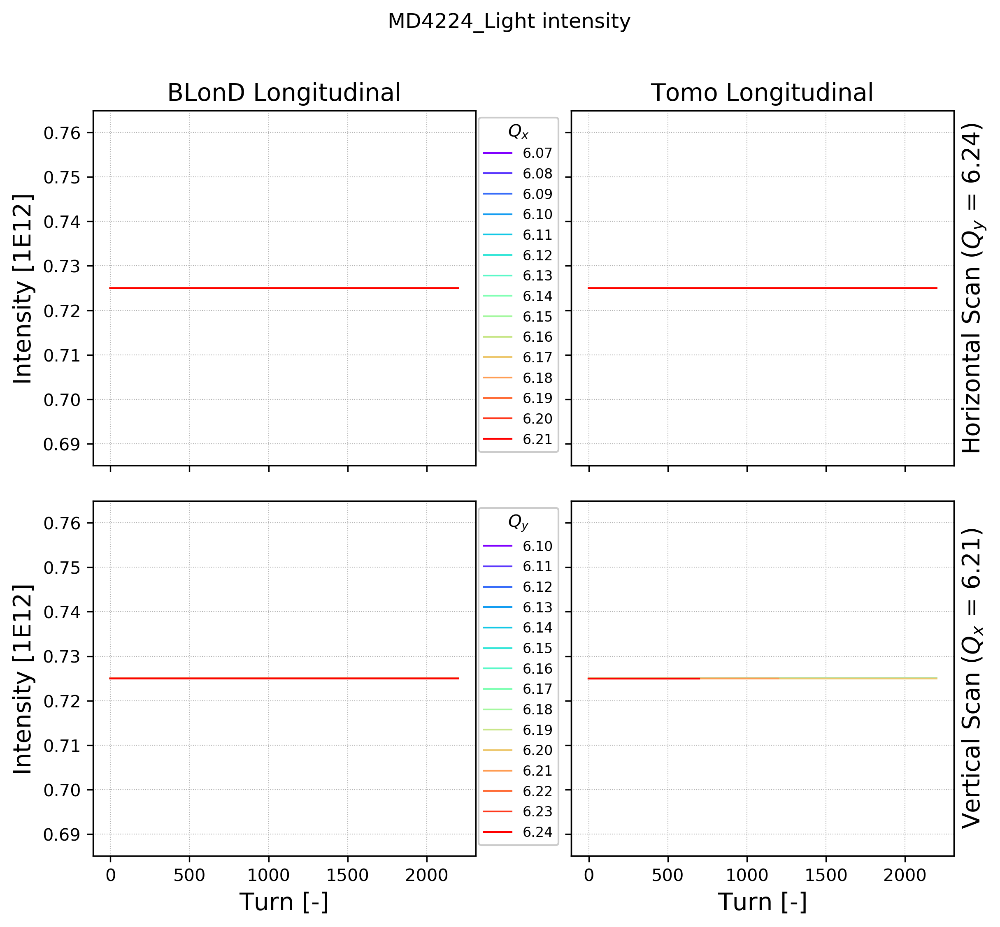

In [10]:
parameter = 'intensity'
multi1 = 1E-12

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace': 0.1, 'wspace': 0.25})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel('Intensity [1E12]');
ax3.set_ylabel('Intensity [1E12]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
        ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
        ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;        

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
        ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
        ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.set_title(title_2)
ax2.set_title(title_1)
        
ax1.grid(lw=0.5, ls=':');
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));

#ax3.set_ylim(ax1.get_ylim())
ax5 = ax2.twinx()
ax5.set_ylabel(case_label_1);
ax6 = ax4.twinx()
ax6.set_ylabel(case_label_2);
ax5.set_yticklabels([]);
ax6.set_yticklabels([]);
ax5.set_yticks([]);
ax6.set_yticks([]);

for ax in axs.flat:
    ax.label_outer()   
    
savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

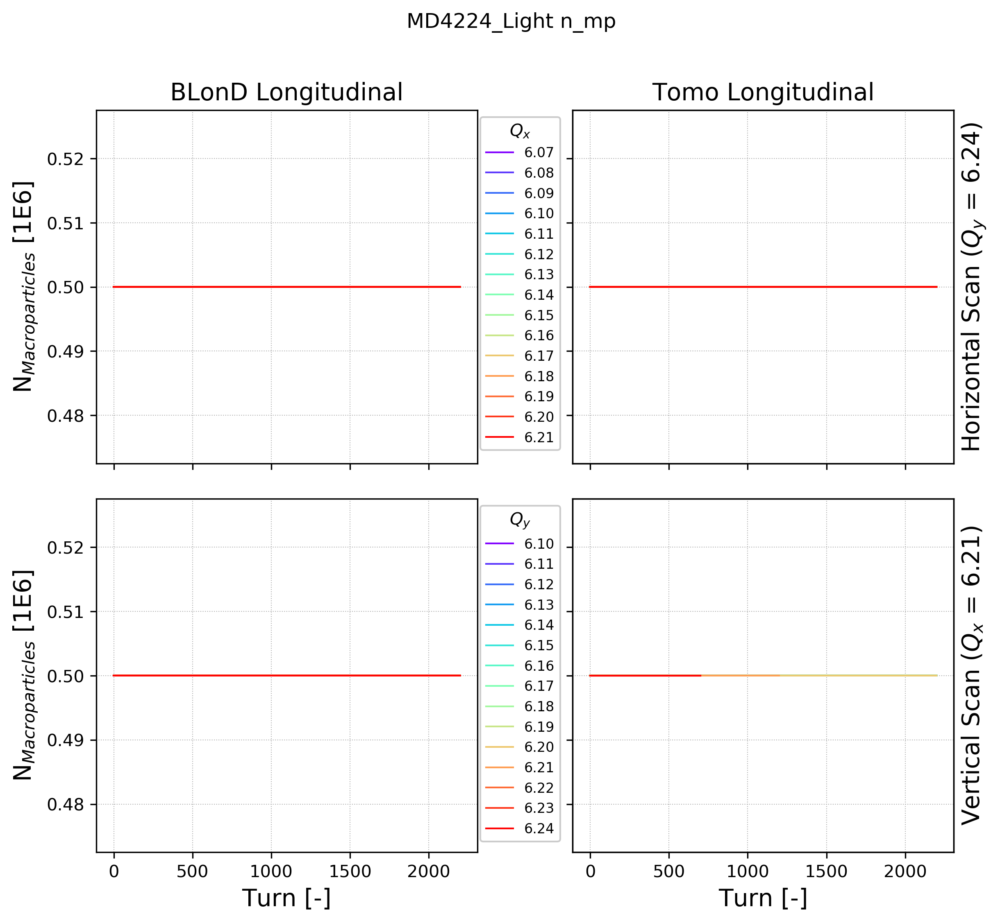

In [11]:
parameter = 'n_mp'
multi1 = 1E-6

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace': 0.1, 'wspace': 0.25})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'N$_{Macroparticles}$ [1E6]');
ax3.set_ylabel(r'N$_{Macroparticles}$ [1E6]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
        ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
        ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;        

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
        ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
        ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.set_title(title_2)
ax2.set_title(title_1)
        
ax1.grid(lw=0.5, ls=':');
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));

#ax3.set_ylim(ax1.get_ylim())
ax5 = ax2.twinx()
ax5.set_ylabel(case_label_1);
ax6 = ax4.twinx()
ax6.set_ylabel(case_label_2);
ax5.set_yticklabels([]);
ax6.set_yticklabels([]);
ax5.set_yticks([]);
ax6.set_yticks([]);

for ax in axs.flat:
    ax.label_outer()   
    
savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

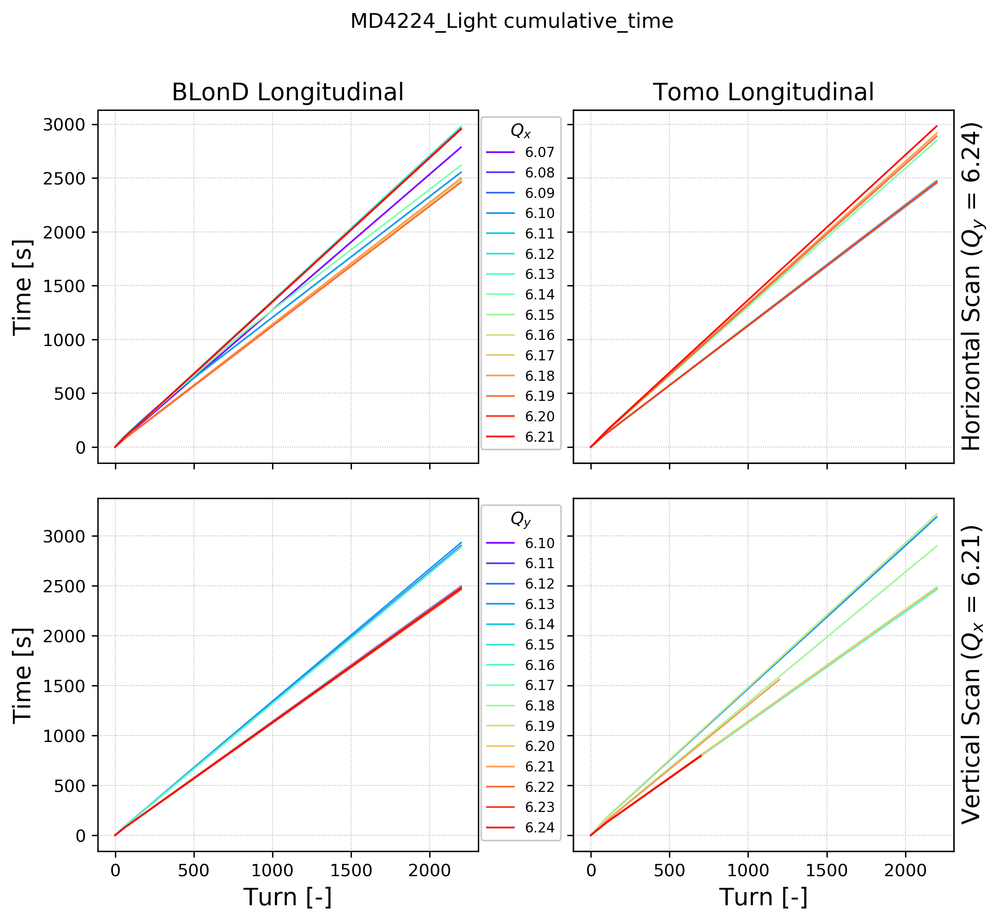

In [12]:
parameter = 'cumulative_time'
multi1 = 1./60.

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace': 0.1, 'wspace': 0.25})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel('Time [s]');
ax3.set_ylabel('Time [s]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
        ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
        ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;        

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
        ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
        ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.set_title(title_2)
ax2.set_title(title_1)
        
ax1.grid(lw=0.5, ls=':');
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));

#ax3.set_ylim(ax1.get_ylim())
ax5 = ax2.twinx()
ax6 = ax4.twinx()
ax5.set_yticklabels([]);
ax6.set_yticklabels([]);
ax5.set_yticks([]);
ax6.set_yticks([]);

ax5.set_ylabel(case_label_1);
ax6.set_ylabel(case_label_2);

for ax in axs.flat:
    ax.label_outer()   
    
savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

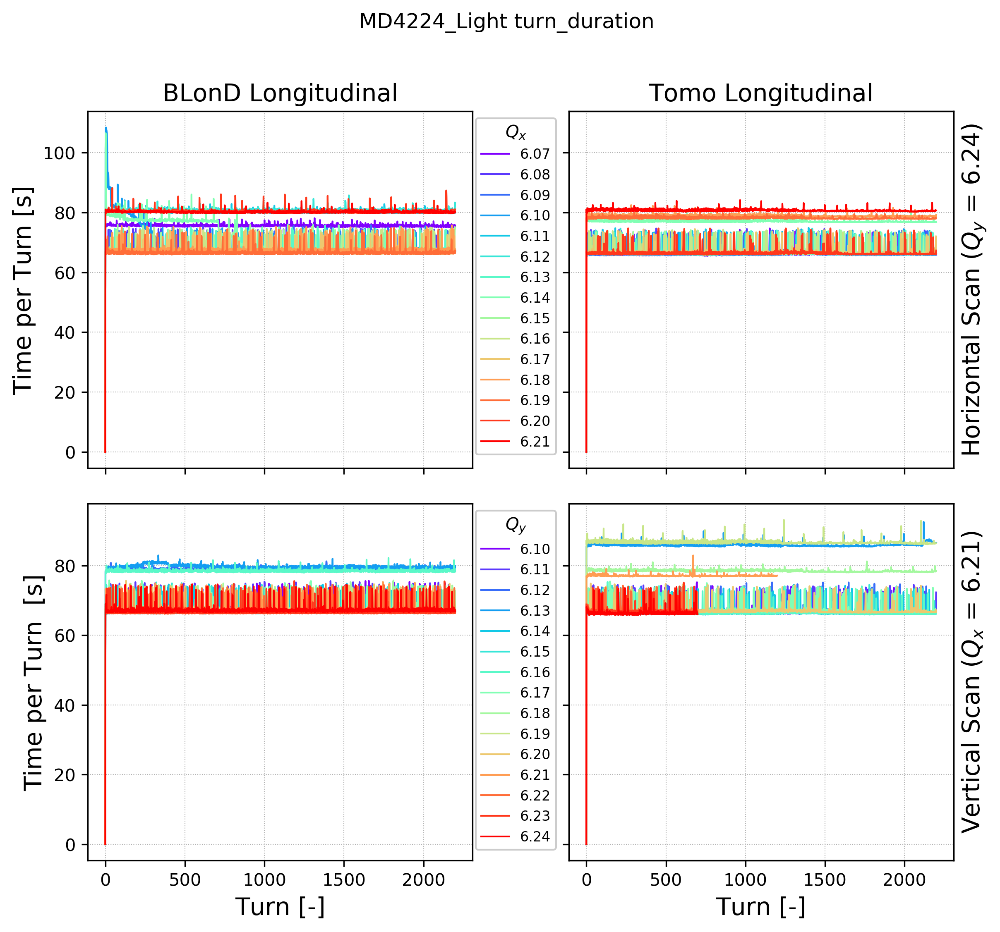

In [13]:
parameter = 'turn_duration'
multi1 = 1

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace': 0.1, 'wspace': 0.25})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel('Time per Turn [s]');
ax3.set_ylabel('Time per Turn  [s]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
        ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
        ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;        

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
        ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
        ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=key, color=colors[c_it]);
        c_it = c_it + 1;
        
ax1.set_title(title_2)
ax2.set_title(title_1)
        
ax1.grid(lw=0.5, ls=':');
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));

#ax3.set_ylim(ax1.get_ylim())
ax5 = ax2.twinx()
ax6 = ax4.twinx()
ax5.set_yticklabels([]);
ax6.set_yticklabels([]);
ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   
    
savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_x  =  6.63  range =  3.34  =  50.4 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  sig_x  =  5.98  range =  2.39  =  39.9 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  sig_x  =  5.47  range =  1.88  =  34.4 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  sig_x  =  5.07  range =  1.39  =  27.4 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  sig_x  =  4.73  range =  1.02  =  21.7 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  sig_x  =  4.47  range =  0.743  =  16.6 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  sig_x  =  4.31  range =  0.537  =  12.5 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  sig_x  =  4.21  range =  0.394  =  9.36 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  sig_x  =  4.12  range =  0.313  =  7.58 %
BLonD Longitudi

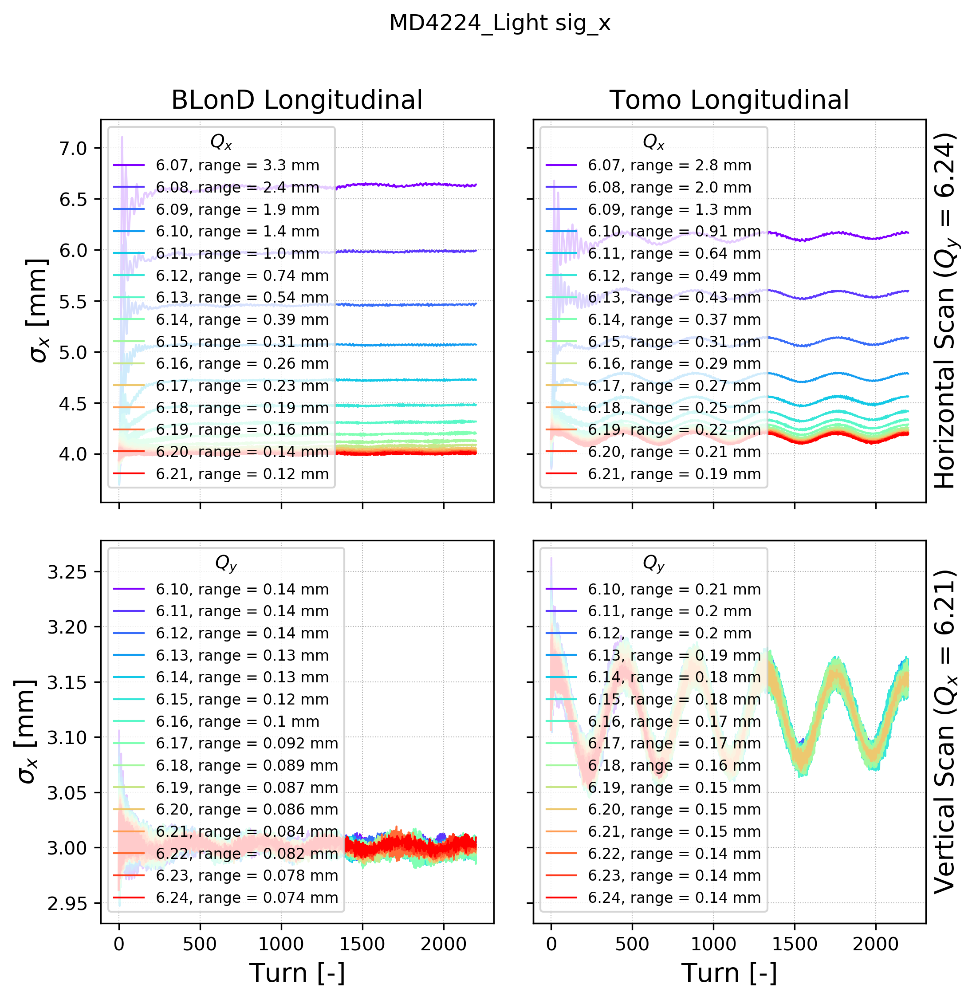

In [14]:
full_labels = True
range_unit = 'mm'
round_sig_limit = 2
parameter = 'sig_x'
multi1 = 1E3

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\sigma_x$ [mm]');
ax3.set_ylabel(r'$\sigma_x$ [mm]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) +  ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) +  ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()  

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_xp  =  0.338  range =  0.223  =  65.9 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  sig_xp  =  0.289  range =  0.152  =  52.6 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  sig_xp  =  0.25  range =  0.111  =  44.5 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  sig_xp  =  0.222  range =  0.0816  =  36.8 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  sig_xp  =  0.198  range =  0.0578  =  29.2 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  sig_xp  =  0.18  range =  0.0401  =  22.2 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  sig_xp  =  0.167  range =  0.0277  =  16.5 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  sig_xp  =  0.159  range =  0.0189  =  11.9 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  sig_xp  =  0.152  range =  0.0123

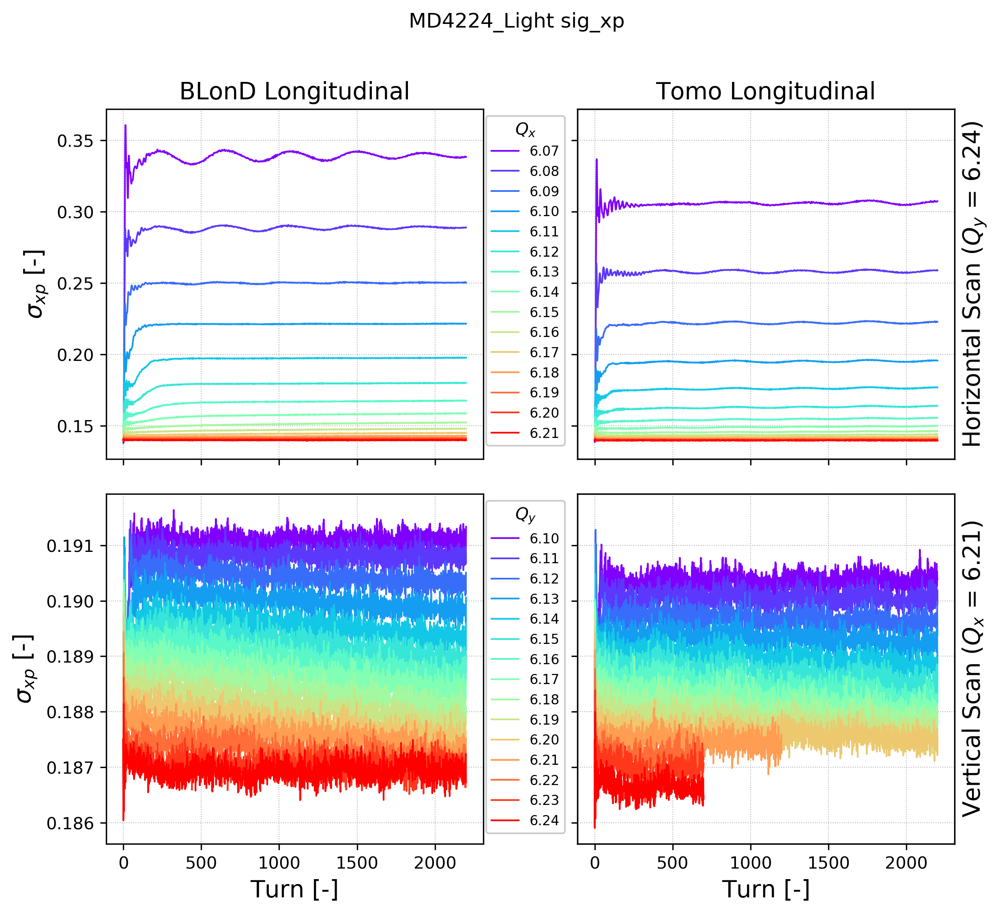

In [15]:
full_labels = False
range_unit = ''
round_sig_limit = 2
parameter = 'sig_xp'
multi1 = 1E3

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\sigma_{xp}$ [-]');
ax3.set_ylabel(r'$\sigma_{xp}$ [-]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;


ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_y  =  2.34  range =  0.105  =  4.48 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  sig_y  =  2.34  range =  0.0905  =  3.87 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  sig_y  =  2.33  range =  0.081  =  3.47 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  sig_y  =  2.33  range =  0.0741  =  3.18 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  sig_y  =  2.33  range =  0.074  =  3.18 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  sig_y  =  2.33  range =  0.0745  =  3.2 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  sig_y  =  2.33  range =  0.0745  =  3.2 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  sig_y  =  2.32  range =  0.0725  =  3.12 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  sig_y  =  2.32  range =  0.0716  =  3.08 %
BLonD 

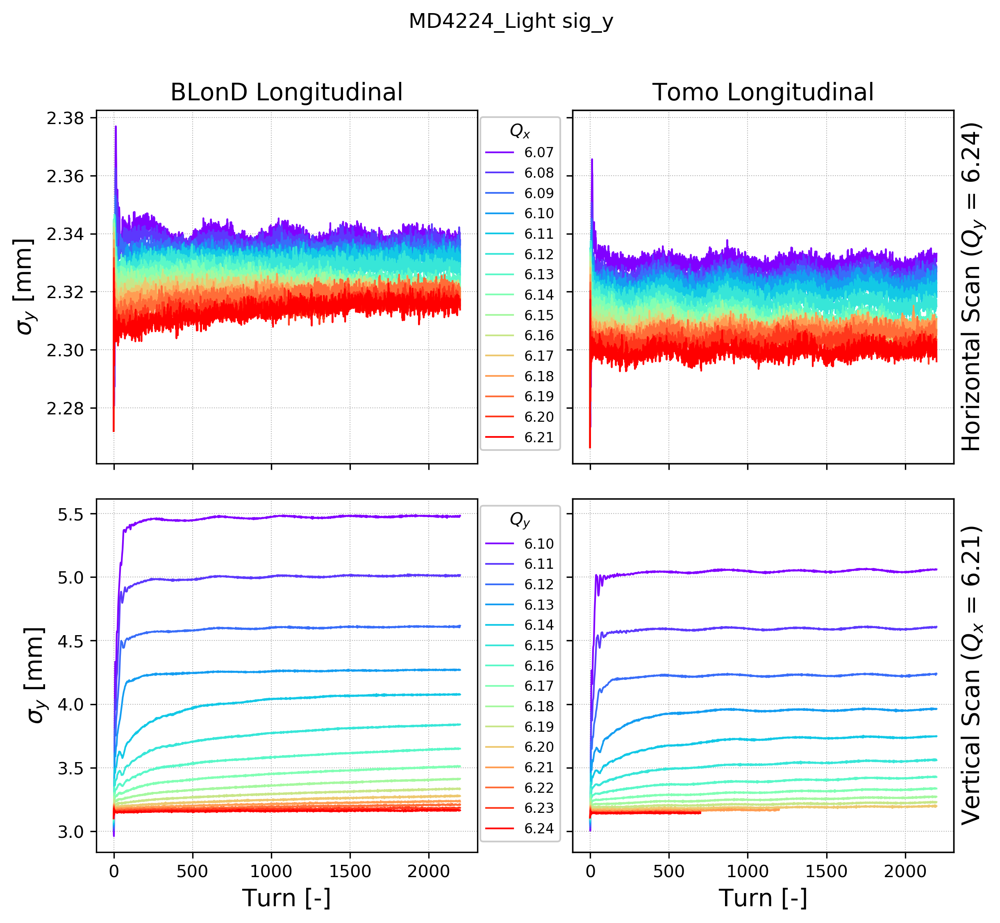

In [16]:
full_labels = False
range_unit = 'mm'
round_sig_limit = 2
parameter = 'sig_y'
multi1 = 1E3

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\sigma_y$ [mm]');
ax3.set_ylabel(r'$\sigma_y$ [mm]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;


ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_yp  =  0.188  range =  0.00772  =  4.09 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  sig_yp  =  0.188  range =  0.00678  =  3.6 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  sig_yp  =  0.189  range =  0.0061  =  3.23 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  sig_yp  =  0.189  range =  0.0058  =  3.07 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  sig_yp  =  0.189  range =  0.00583  =  3.08 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  sig_yp  =  0.189  range =  0.00591  =  3.13 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  sig_yp  =  0.189  range =  0.0059  =  3.12 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  sig_yp  =  0.189  range =  0.00573  =  3.03 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  sig_yp  =  0.189  range 

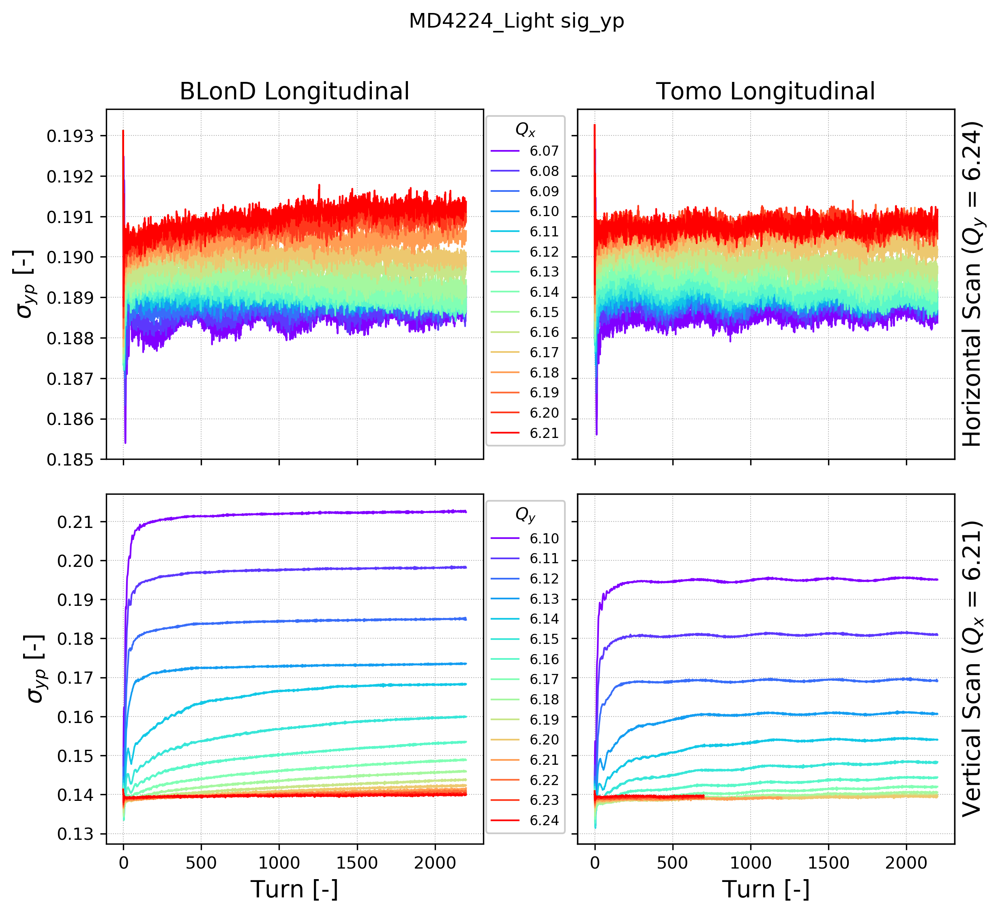

In [17]:
full_labels = False
range_unit = ''
round_sig_limit = 2
parameter = 'sig_yp'
multi1 = 1E3

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\sigma_{yp}$ [-]');
ax3.set_ylabel(r'$\sigma_{yp}$ [-]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;


ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  beta_x  =  18.3  range =  14.2  =  77.6 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  beta_x  =  18.7  range =  9.99  =  53.3 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  beta_x  =  19.1  range =  6.1  =  31.9 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  beta_x  =  19.4  range =  5.15  =  26.5 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  beta_x  =  19.7  range =  4.59  =  23.3 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  beta_x  =  20.0  range =  3.89  =  19.5 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  beta_x  =  20.3  range =  3.15  =  15.5 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  beta_x  =  20.6  range =  2.52  =  12.2 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  beta_x  =  21.0  range =  2.01  =  9.55 %
BLonD Longi

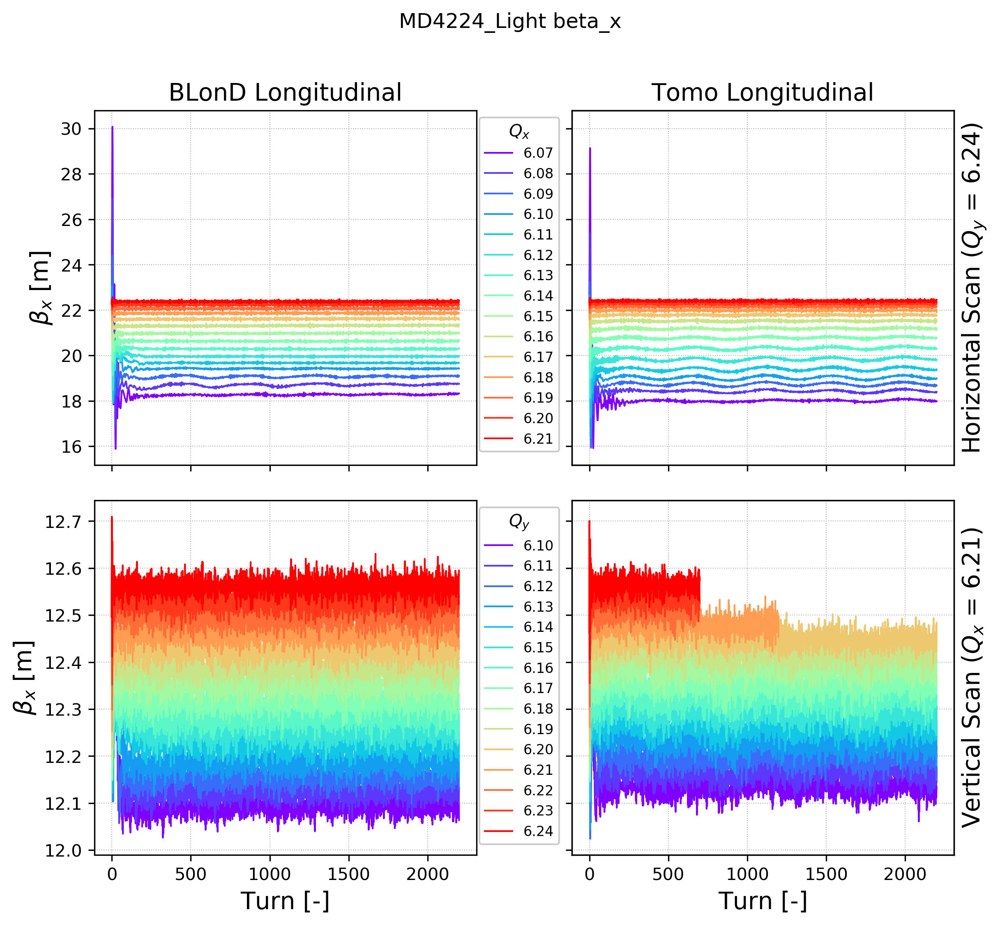

In [18]:
full_labels = False
range_unit = 'm'
round_sig_limit = 2
parameter = 'beta_x'
multi1 = 1

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\beta_x$ [m]');
ax3.set_ylabel(r'$\beta_x$ [m]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    
ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  beta_y  =  12.4  range =  1.04  =  8.36 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  beta_y  =  12.4  range =  0.898  =  7.23 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  beta_y  =  12.4  range =  0.803  =  6.49 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  beta_y  =  12.4  range =  0.744  =  6.02 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  beta_y  =  12.3  range =  0.749  =  6.08 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  beta_y  =  12.4  range =  0.758  =  6.13 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  beta_y  =  12.3  range =  0.759  =  6.15 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  beta_y  =  12.3  range =  0.748  =  6.08 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  beta_y  =  12.3  range =  0.738  =  6.01 %
BL

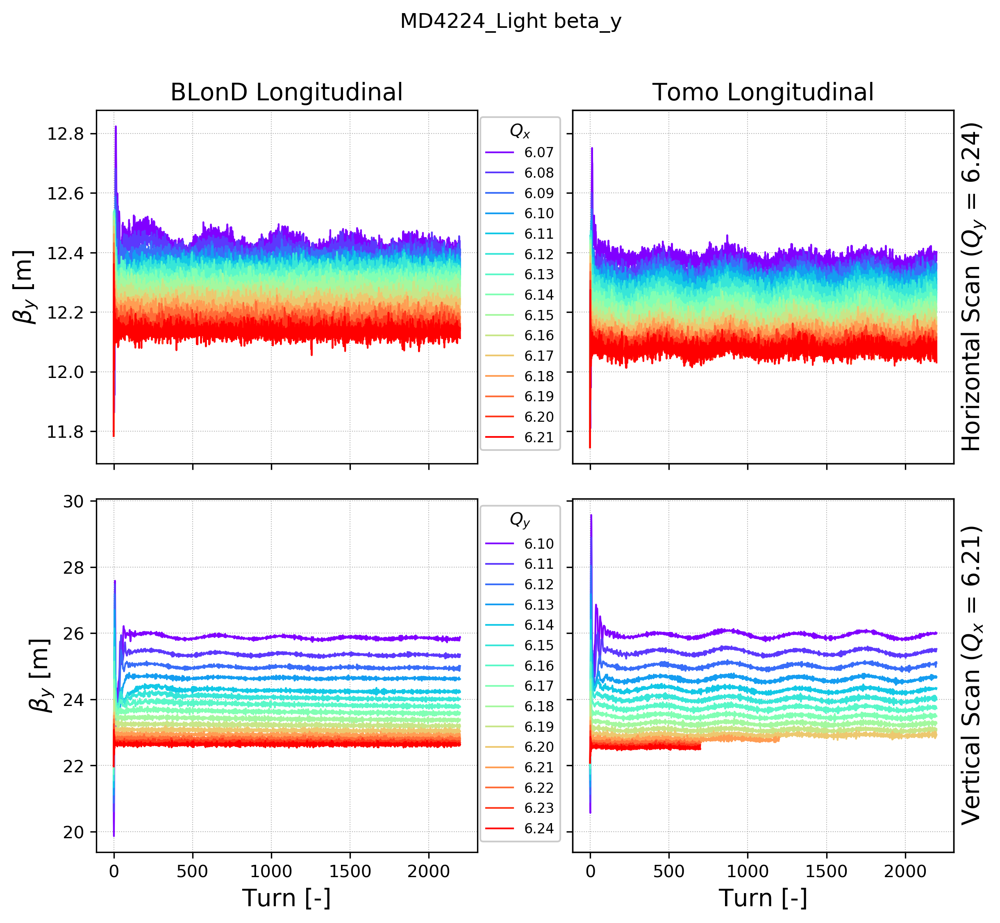

In [19]:
full_labels = False
range_unit = 'm'
round_sig_limit = 2
parameter = 'beta_y'
multi1 = 1

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\beta_y$ [m]');
ax3.set_ylabel(r'$\beta_y$ [m]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  D_x  =  3.92  range =  6.45  =  165.0 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  D_x  =  3.83  range =  3.82  =  99.9 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  D_x  =  3.77  range =  2.56  =  67.9 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  D_x  =  3.69  range =  1.93  =  52.3 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  D_x  =  3.62  range =  1.48  =  40.8 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  D_x  =  3.54  range =  1.22  =  34.5 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  D_x  =  3.5  range =  1.01  =  28.8 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  D_x  =  3.49  range =  0.849  =  24.3 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  D_x  =  3.42  range =  0.741  =  21.7 %
BLonD Longitudinal   Horizontal Sca

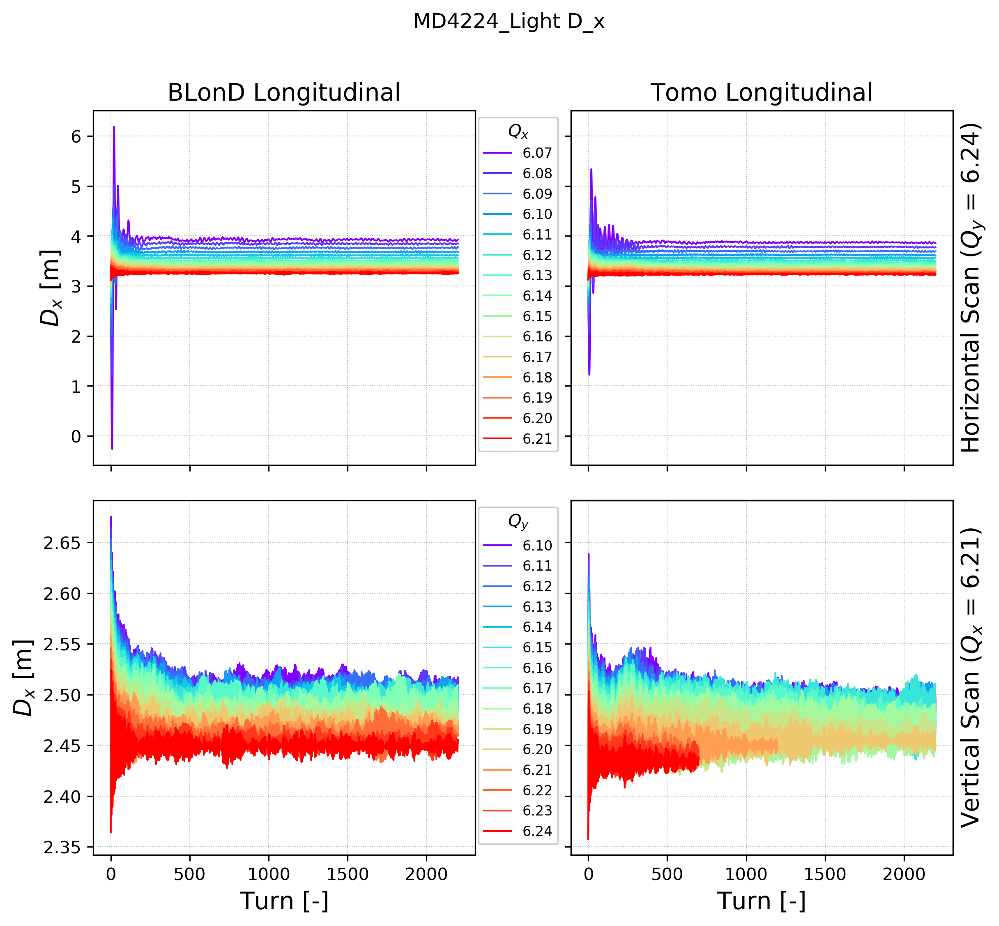

In [20]:
full_labels = False
range_unit = 'm'
round_sig_limit = 2
parameter = 'D_x'
multi1 = 1

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$D_x$ [m]');
ax3.set_ylabel(r'$D_x$ [m]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  D_y  =  -0.00588  range =  0.0264  =  -449.0 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  D_y  =  0.0025  range =  0.0319  =  1280.0 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  D_y  =  0.000575  range =  0.0282  =  4900.0 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  D_y  =  -0.00103  range =  0.0291  =  -2810.0 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  D_y  =  0.00525  range =  0.0249  =  474.0 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  D_y  =  0.00174  range =  0.0317  =  1820.0 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  D_y  =  0.000468  range =  0.0282  =  6040.0 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  D_y  =  -0.00329  range =  0.0299  =  -910.0 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  D_y  =  0.00235 

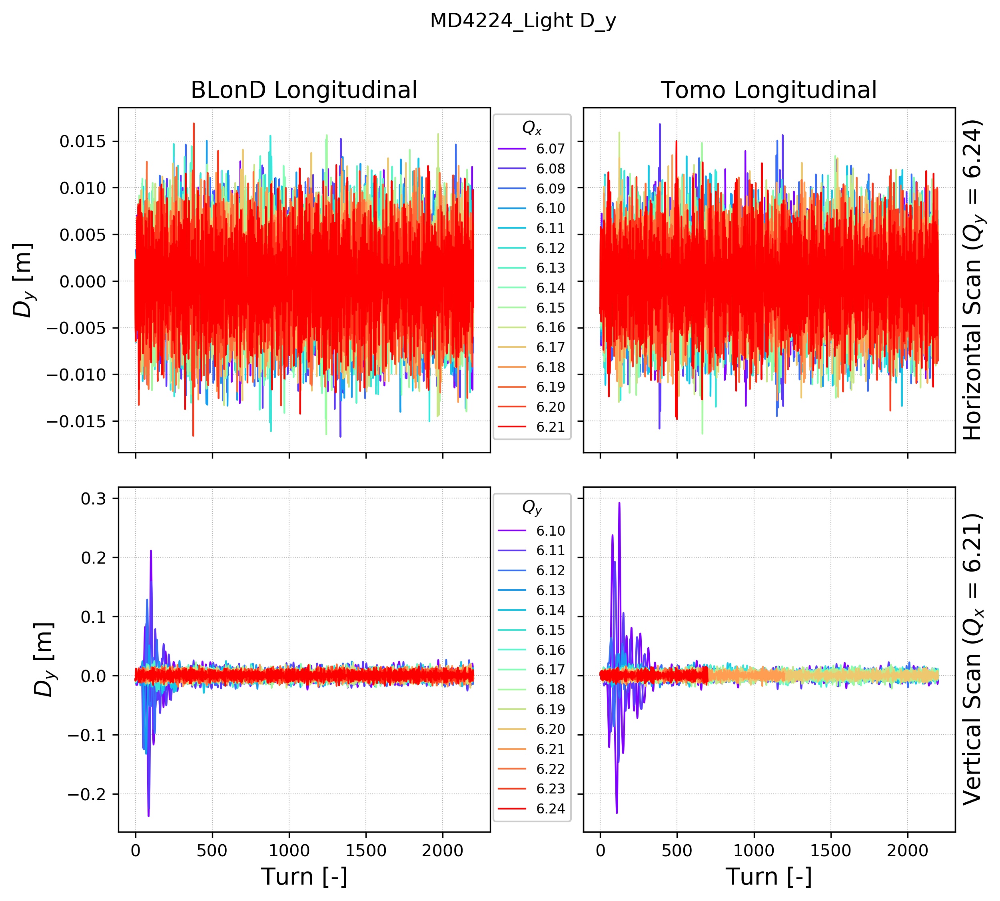

In [21]:
full_labels = False
range_unit = 'm'
round_sig_limit = 2
parameter = 'D_y'
multi1 = 1

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$D_y$ [m]');
ax3.set_ylabel(r'$D_y$ [m]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  dpp_rms  =  0.764  range =  0.00795  =  1.04 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  dpp_rms  =  0.764  range =  0.00598  =  0.783 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  dpp_rms  =  0.764  range =  0.00374  =  0.489 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  dpp_rms  =  0.766  range =  0.00199  =  0.26 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  dpp_rms  =  0.766  range =  0.00272  =  0.355 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  dpp_rms  =  0.766  range =  0.00327  =  0.426 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  dpp_rms  =  0.766  range =  0.00366  =  0.478 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  dpp_rms  =  0.766  range =  0.00395  =  0.516 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  dpp_rm

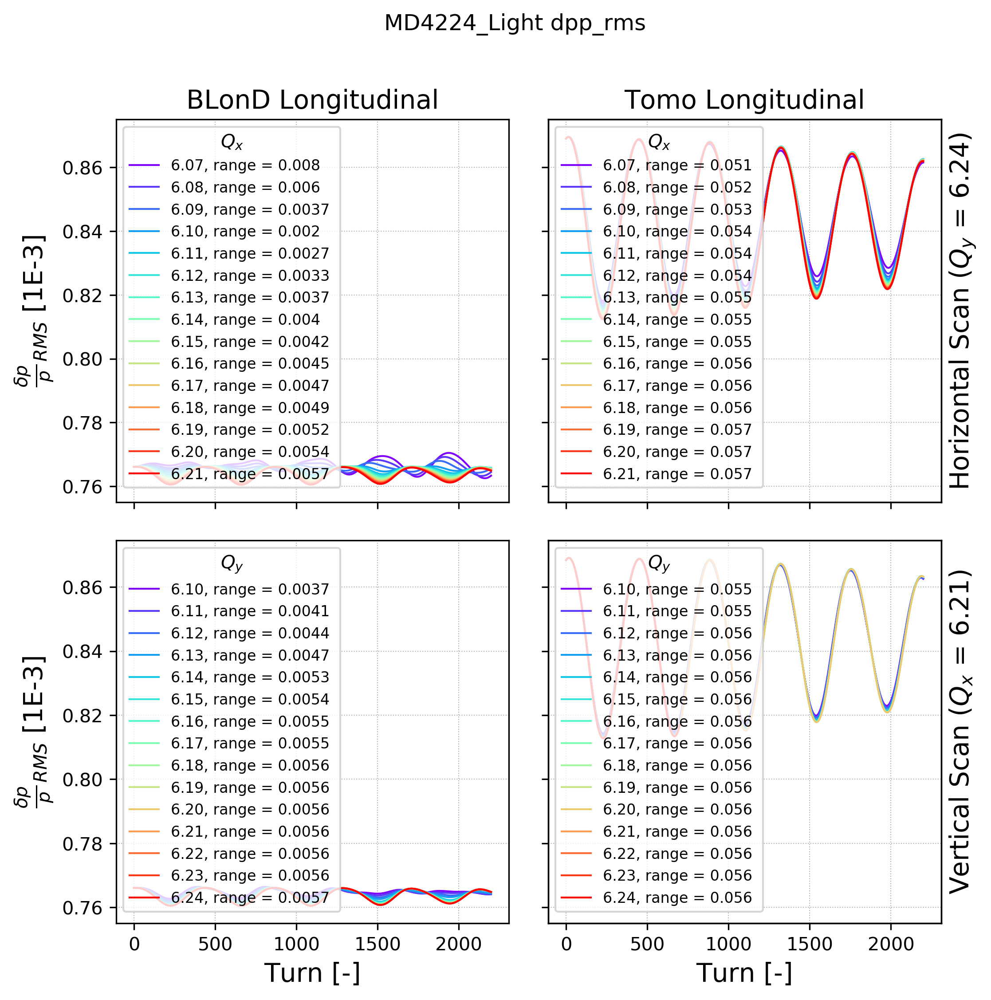

In [22]:
full_labels = True
range_unit = ''
round_sig_limit = 2
parameter = 'dpp_rms'
multi1 = 1E3

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\frac{\delta p}{p}_{RMS}$ [1E-3]');
ax3.set_ylabel(r'$\frac{\delta p}{p}_{RMS}$ [1E-3]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  bunchlength  =  125.0  range =  1.3  =  1.04 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  bunchlength  =  125.0  range =  0.962  =  0.768 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  bunchlength  =  125.0  range =  0.599  =  0.479 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  bunchlength  =  125.0  range =  0.312  =  0.25 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  bunchlength  =  125.0  range =  0.458  =  0.366 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  bunchlength  =  125.0  range =  0.55  =  0.44 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  bunchlength  =  125.0  range =  0.617  =  0.493 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  bunchlength  =  125.0  range =  0.667  =  0.534 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.15 Ave

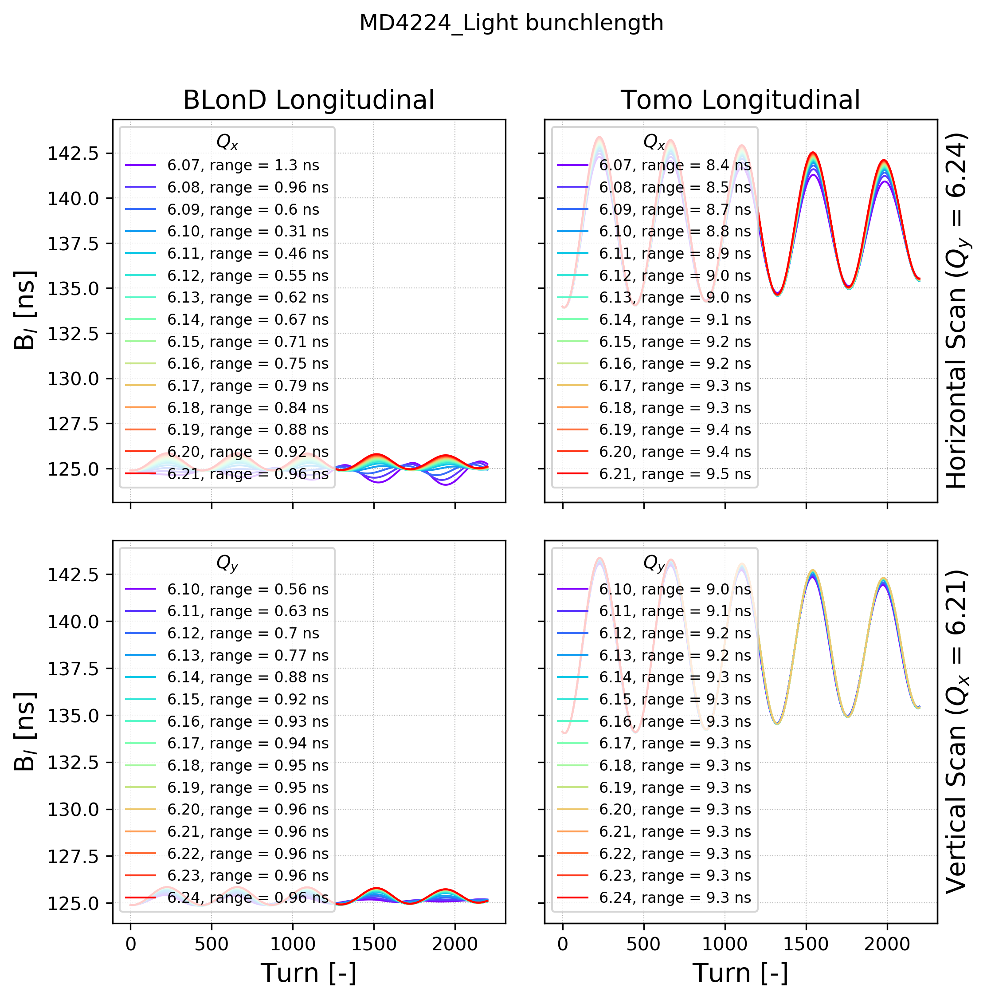

In [23]:
full_labels = True
range_unit = 'ns'
round_sig_limit = 2
parameter = 'bunchlength'
multi1 = 1E9

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'B$_l$ [ns]');
ax3.set_ylabel(r'B$_l$ [ns]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_z  =  8.59  range =  0.0892  =  1.04 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  sig_z  =  8.6  range =  0.066  =  0.768 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  sig_z  =  8.6  range =  0.0411  =  0.479 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  sig_z  =  8.58  range =  0.0214  =  0.25 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  sig_z  =  8.58  range =  0.0314  =  0.366 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  sig_z  =  8.58  range =  0.0378  =  0.44 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  sig_z  =  8.58  range =  0.0423  =  0.493 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  sig_z  =  8.58  range =  0.0458  =  0.534 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  sig_z  =  8.58  range =  0.0489  =  0.569 

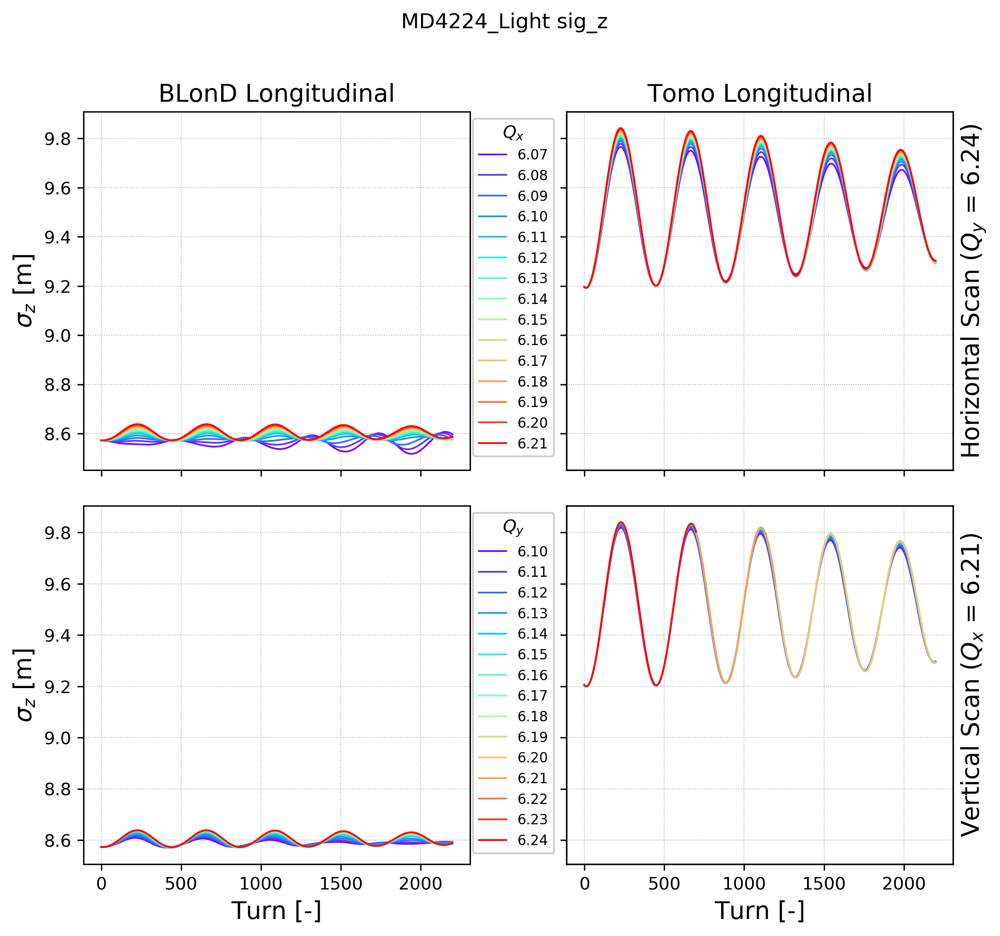

In [24]:
full_labels = False
range_unit = 'm'
round_sig_limit = 2
parameter = 'sig_z'
multi1 = 1

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)
ax1.set_ylabel(r'$\sigma_z$ [m]');
ax3.set_ylabel(r'$\sigma_z$ [m]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  sig_dE  =  1.5  range =  0.0156  =  1.04 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  sig_dE  =  1.5  range =  0.0117  =  0.783 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  sig_dE  =  1.5  range =  0.00733  =  0.489 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  sig_dE  =  1.5  range =  0.0039  =  0.26 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  sig_dE  =  1.5  range =  0.00534  =  0.355 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  sig_dE  =  1.5  range =  0.0064  =  0.426 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  sig_dE  =  1.5  range =  0.00717  =  0.478 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  sig_dE  =  1.5  range =  0.00775  =  0.516 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  sig_dE  =  1.5  range =  0.00824  

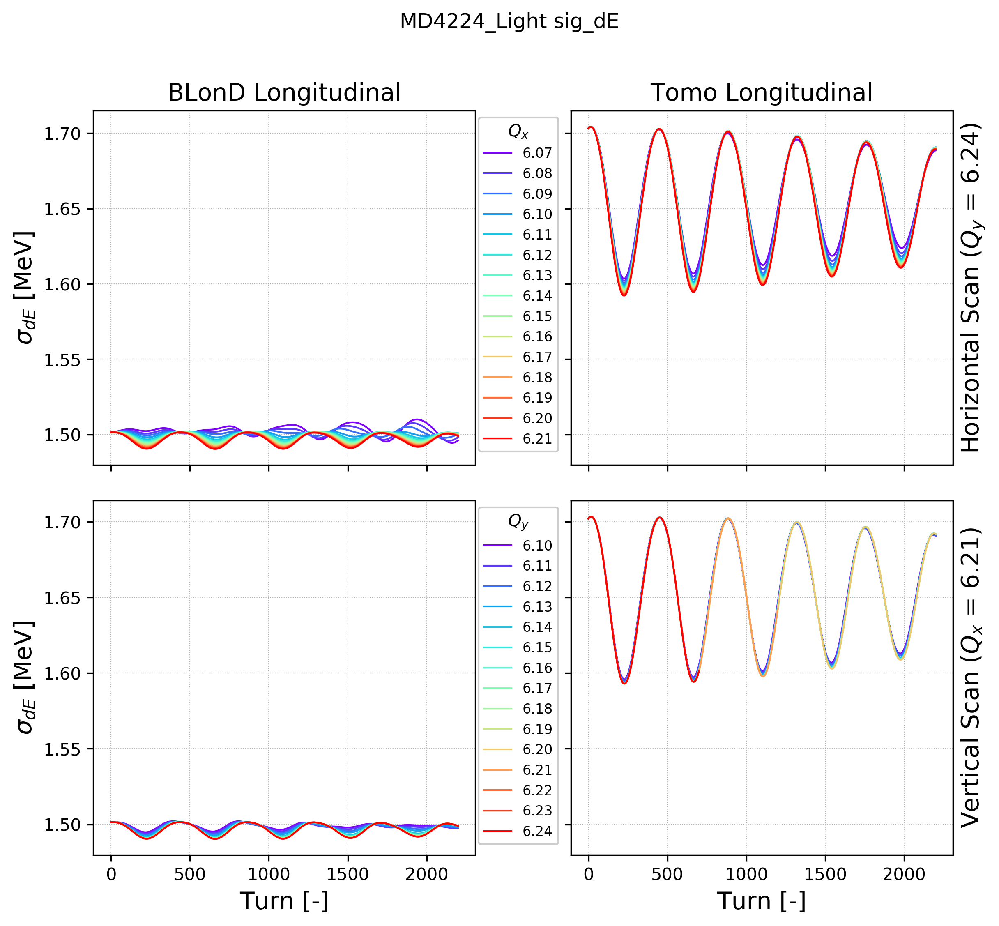

In [25]:
full_labels = False
range_unit = 'm'
round_sig_limit = 2
parameter = 'sig_dE'
multi1 = 1E3

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)
ax1.set_ylabel(r'$\sigma_{dE}$ [MeV]');
ax3.set_ylabel(r'$\sigma_{dE}$ [MeV]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  eps_z  =  0.589  range =  0.000962  =  0.163 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  eps_z  =  0.589  range =  0.000754  =  0.128 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  eps_z  =  0.589  range =  0.000603  =  0.102 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  eps_z  =  0.589  range =  0.000446  =  0.0757 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  eps_z  =  0.589  range =  0.000415  =  0.0704 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  eps_z  =  0.589  range =  0.000407  =  0.069 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  eps_z  =  0.589  range =  0.00041  =  0.0696 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  eps_z  =  0.589  range =  0.000413  =  0.07 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  eps_z  =  0

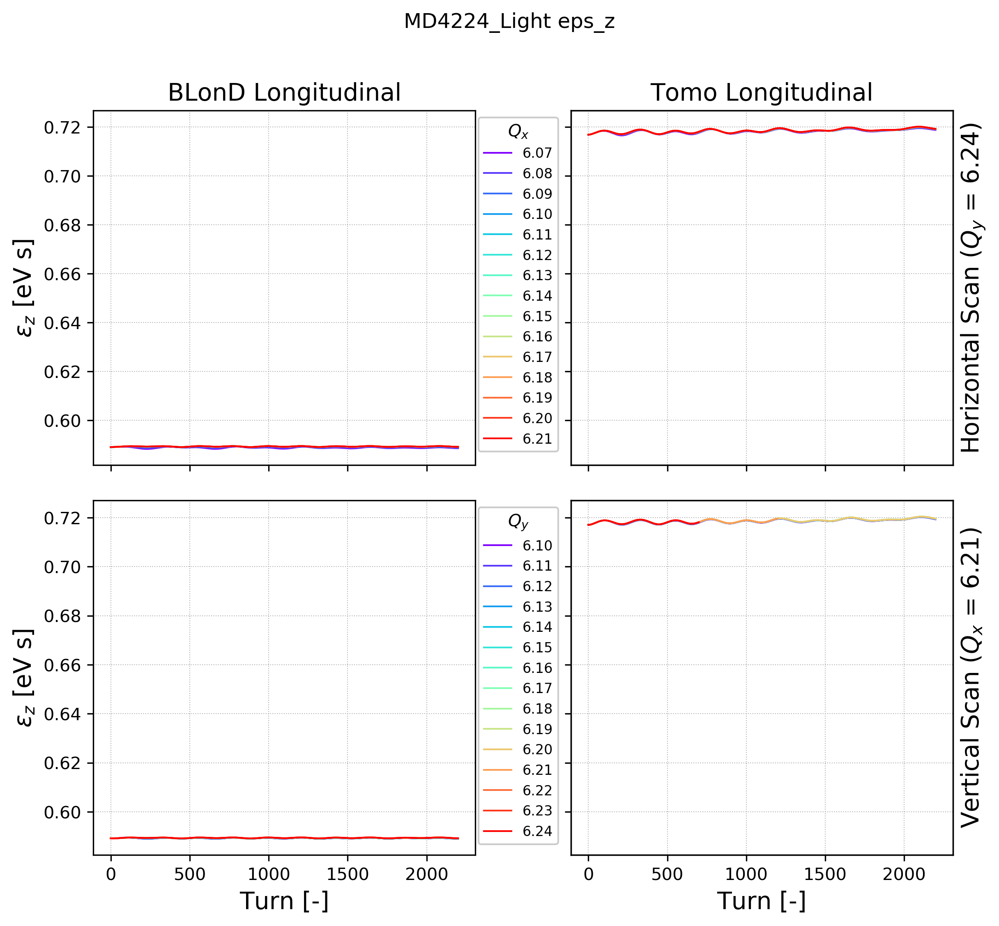

In [26]:
full_labels = False
range_unit = 'eV s'
round_sig_limit = 2
parameter = 'eps_z'
multi1 = 1

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)
ax1.set_ylabel(r'$\epsilon_z$ [eV s]');
ax3.set_ylabel(r'$\epsilon_z$ [eV s]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

#ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  epsn_x  =  4.36  range =  3.37  =  77.4 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  epsn_x  =  3.31  range =  2.31  =  69.9 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  epsn_x  =  2.58  range =  1.58  =  61.3 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  epsn_x  =  2.09  range =  1.09  =  52.1 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  epsn_x  =  1.7  range =  0.702  =  41.3 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  epsn_x  =  1.44  range =  0.446  =  30.9 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  epsn_x  =  1.28  range =  0.283  =  22.1 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  epsn_x  =  1.17  range =  0.176  =  15.0 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  epsn_x  =  1.1  range =  0.105  =  9.54 %
BLonD L

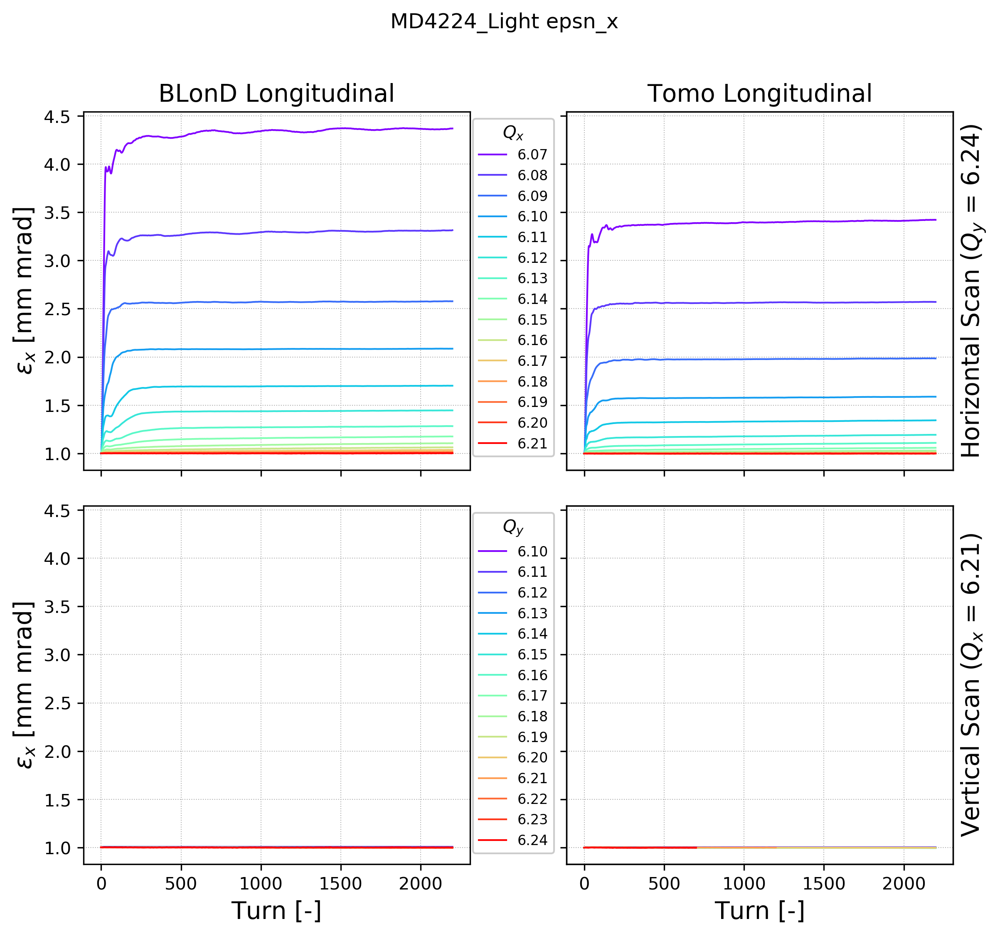

In [27]:
full_labels = False
range_unit = 'mm mrad'
round_sig_limit = 2
parameter = 'epsn_x'
multi1 = 1E6

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)
ax1.set_ylabel(r'$\epsilon_x$ [mm mrad]');
ax3.set_ylabel(r'$\epsilon_x$ [mm mrad]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  epsn_y  =  1.0  range =  0.00604  =  0.601 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  epsn_y  =  1.0  range =  0.0056  =  0.558 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  epsn_y  =  1.0  range =  0.00526  =  0.524 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  epsn_y  =  1.0  range =  0.00511  =  0.509 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  epsn_y  =  1.0  range =  0.00524  =  0.522 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  epsn_y  =  1.0  range =  0.00518  =  0.516 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  epsn_y  =  0.999  range =  0.00547  =  0.548 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  epsn_y  =  0.998  range =  0.00615  =  0.617 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  epsn_y  =  1.0  range =  

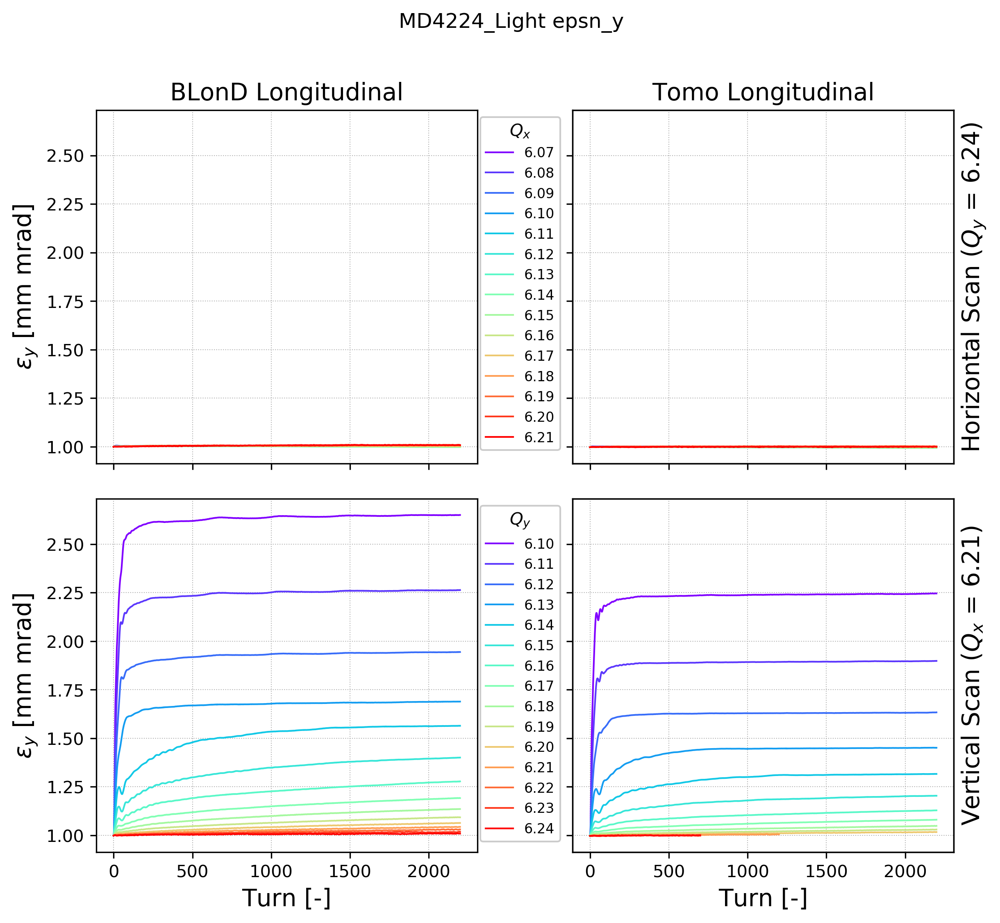

In [28]:
full_labels = False
range_unit = 'mm mrad'
round_sig_limit = 2
parameter = 'epsn_y'
multi1 = 1E6

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)
ax1.set_ylabel(r'$\epsilon_y$ [mm mrad]');
ax3.set_ylabel(r'$\epsilon_y$ [mm mrad]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(dd1[key]['turn'][0], dd1[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;       

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(dd2[key]['turn'][0], dd2[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    
    av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(dd3[key]['turn'][0], dd3[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;     

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
    rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(dd4[key]['turn'][0], dd4[key][parameter][0]*multi1, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

ax1.set_ylim(ax3.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_' + parameter + '.png'
plt.savefig(savename);

BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  epsn_y  =  2.68  range =  1.69  =  63.0 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  epsn_y  =  2.16  range =  1.16  =  53.8 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  epsn_y  =  1.79  range =  0.792  =  44.2 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  epsn_y  =  1.54  range =  0.545  =  35.3 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  epsn_y  =  1.35  range =  0.353  =  26.1 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  epsn_y  =  1.22  range =  0.224  =  18.3 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  epsn_y  =  1.14  range =  0.141  =  12.4 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  epsn_y  =  1.09  range =  0.0874  =  8.04 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  epsn_y  =  1.05  range =  0.0528  =  5.02 %
B

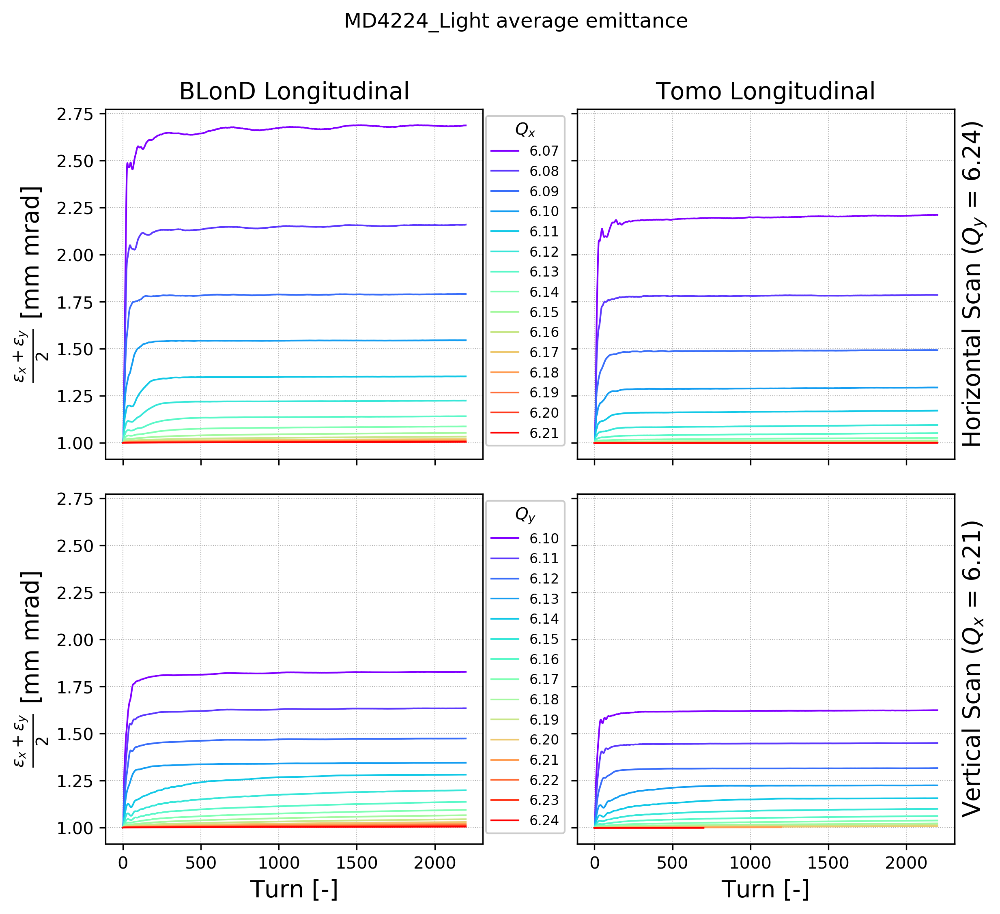

In [29]:
full_labels = False
range_unit = 'mm mrad'
round_sig_limit = 2

parameter1 = 'epsn_x'
multi1 = 1E6
parameter2 = 'epsn_y'
multi2 = 1E6

if full_labels:
    plt.rcParams['figure.figsize'] = [8.0, 8.0]
    hspace = 0.1
    vspace = 0.1
else:    
    plt.rcParams['figure.figsize'] = [9.0, 8.0]
    hspace = 0.1
    vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' average emittance'

fig.suptitle(tit)

ax1.set_ylabel(r'$\frac{\epsilon_x + \epsilon_y}{2}$ [mm mrad]');
ax3.set_ylabel(r'$\frac{\epsilon_x + \epsilon_y}{2}$ [mm mrad]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');

colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
    x = np.array(dd1[key]['turn'][0])
    y = np.array((dd1[key][parameter1][0]*multi1 + dd1[key][parameter2][0]*multi2)/2)
    av_ = np.mean(y[-100])
    rang_ = np.abs(np.max(y) - np.min(y))
    print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax1.plot(x, y, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
      

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
    x = np.array(dd2[key]['turn'][0])
    y = np.array((dd2[key][parameter1][0]*multi1 + dd2[key][parameter2][0]*multi2)/2)
    av_ = np.mean(y[-100])
    rang_ = np.abs(np.max(y) - np.min(y))
    print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax2.plot(x, y, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   
 
        
colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
    x = np.array(dd3[key]['turn'][0])
    y = np.array((dd3[key][parameter1][0]*multi1 + dd3[key][parameter2][0]*multi2)/2)
    av_ = np.mean(y[-100])
    rang_ = np.abs(np.max(y) - np.min(y))
    print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax3.plot(x, y, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
    x = np.array(dd4[key]['turn'][0])
    y = np.array((dd4[key][parameter1][0]*multi1 + dd4[key][parameter2][0]*multi2)/2)
    av_ = np.mean(y[-100])
    rang_ = np.abs(np.max(y) - np.min(y))
    print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
    str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
    if full_labels: lab_ = key + ', range = ' + str(round_sig(rang_,round_sig_limit)) + ' ' + range_unit
    else: lab_ = key
    ax4.plot(x, y, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;   

ax2.set_title(title_1);
ax1.set_title(title_2);

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.grid(lw=0.5, ls=':');     
ax2.grid(lw=0.5, ls=':');
ax3.grid(lw=0.5, ls=':');
ax4.grid(lw=0.5, ls=':');

ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax6 = ax4.twinx()

ax5.set_yticklabels([]);
ax6.set_yticklabels([]);

ax5.set_yticks([]);
ax6.set_yticks([]);

ax6.set_ylabel(case_label_2);
ax5.set_ylabel(case_label_1);

for ax in axs.flat:
    ax.label_outer()   

savename = save_folder +'/' + main_label + '_average_emittance.png'
plt.savefig(savename); 

BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  epsn_x  =  4.36  range =  3.37  =  77.4 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  epsn_x  =  3.31  range =  2.31  =  69.9 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  epsn_x  =  2.58  range =  1.58  =  61.3 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  epsn_x  =  2.09  range =  1.09  =  52.1 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  epsn_x  =  1.7  range =  0.702  =  41.3 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  epsn_x  =  1.44  range =  0.446  =  30.9 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  epsn_x  =  1.28  range =  0.283  =  22.1 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  epsn_x  =  1.17  range =  0.176  =  15.0 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  epsn_x  =  1.1  range =  0.105  =  9.54 %
BLonD L

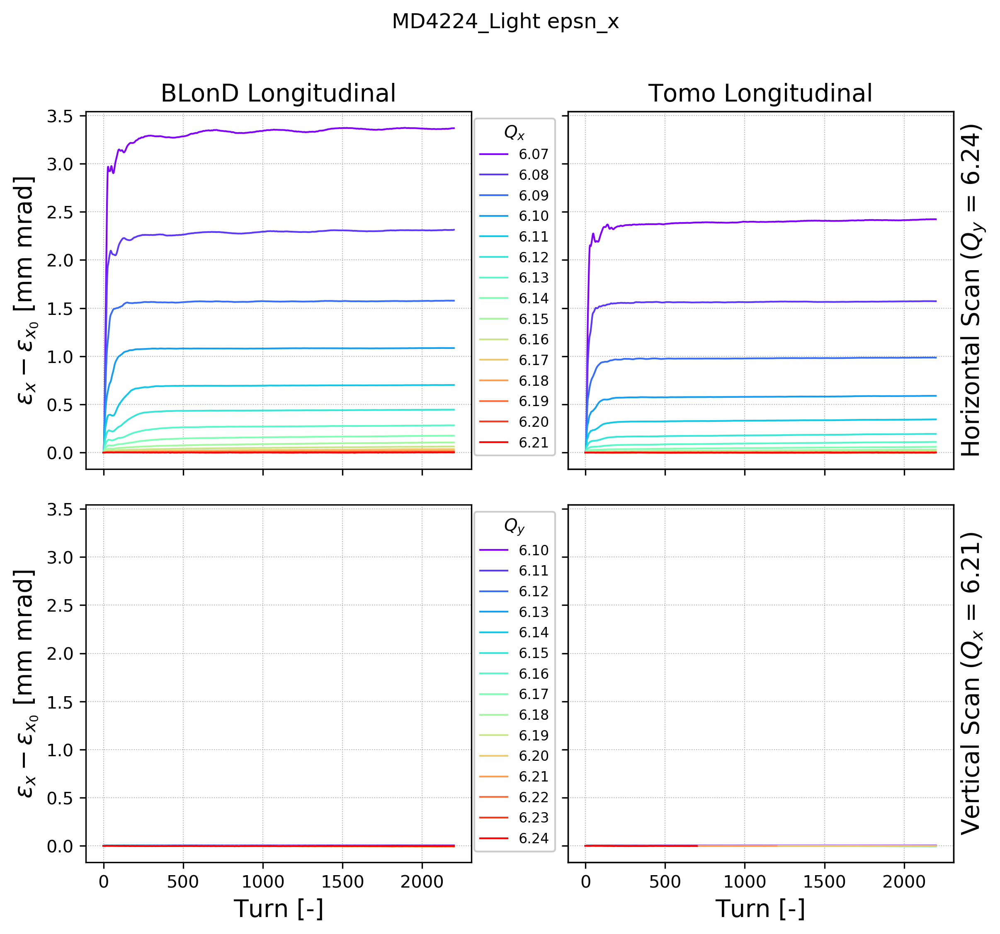

In [30]:
parameter = 'epsn_x'
multi1 = 1E6

plt.rcParams['figure.figsize'] = [9.0, 8.0]
hspace = 0.1
vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\epsilon_x-\epsilon_{x_0}$ [mm mrad]');
ax3.set_ylabel(r'$\epsilon_x-\epsilon_{x_0}$ [mm mrad]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');


colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
        ax1.plot(dd1[key]['turn'][0], ((dd1[key][parameter][0]*multi1)-(dd1[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);
        av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
        print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
        c_it = c_it + 1;       

ax1.grid(lw=0.5, ls=':');

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
        ax2.plot(dd2[key]['turn'][0], ((dd2[key][parameter][0]*multi1)-(dd2[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);  
        av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
        print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'        
        c_it = c_it + 1;        
ax2.grid(lw=0.5, ls=':');
ax2.set_title(title_1)

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
        ax3.plot(dd3[key]['turn'][0], ((dd3[key][parameter][0]*multi1)-(dd3[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);
        av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
        print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'        
        c_it = c_it + 1;
ax3.grid(lw=0.5, ls=':');
ax1.set_title(title_2)

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
        ax4.plot(dd4[key]['turn'][0], ((dd4[key][parameter][0]*multi1)-(dd4[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);
        av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
        print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'        
        c_it = c_it + 1;
ax4.grid(lw=0.5, ls=':');

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax3.set_ylim(ax1.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax5.set_ylabel(case_label_1);
ax6 = ax4.twinx()
ax6.set_ylabel(case_label_2);
ax5.set_yticklabels([]);
ax6.set_yticklabels([]);
ax5.set_yticks([]);
ax6.set_yticks([]);


for ax in axs.flat:
    ax.label_outer()   
    
savename = save_folder +'/' + main_label + '_' + parameter + '_growth_cf.png'
plt.savefig(savename, dpi = 800);

BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.07 Average  epsn_y  =  1.0  range =  0.00604  =  0.601 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.08 Average  epsn_y  =  1.0  range =  0.0056  =  0.558 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.09 Average  epsn_y  =  1.0  range =  0.00526  =  0.524 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.10 Average  epsn_y  =  1.0  range =  0.00511  =  0.509 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.11 Average  epsn_y  =  1.0  range =  0.00524  =  0.522 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.12 Average  epsn_y  =  1.0  range =  0.00518  =  0.516 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.13 Average  epsn_y  =  0.999  range =  0.00547  =  0.548 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.14 Average  epsn_y  =  0.998  range =  0.00615  =  0.617 %
BLonD Longitudinal   Horizontal Scan ($Q_y$ = 6.24)   6.15 Average  epsn_y  =  1.0  range =  

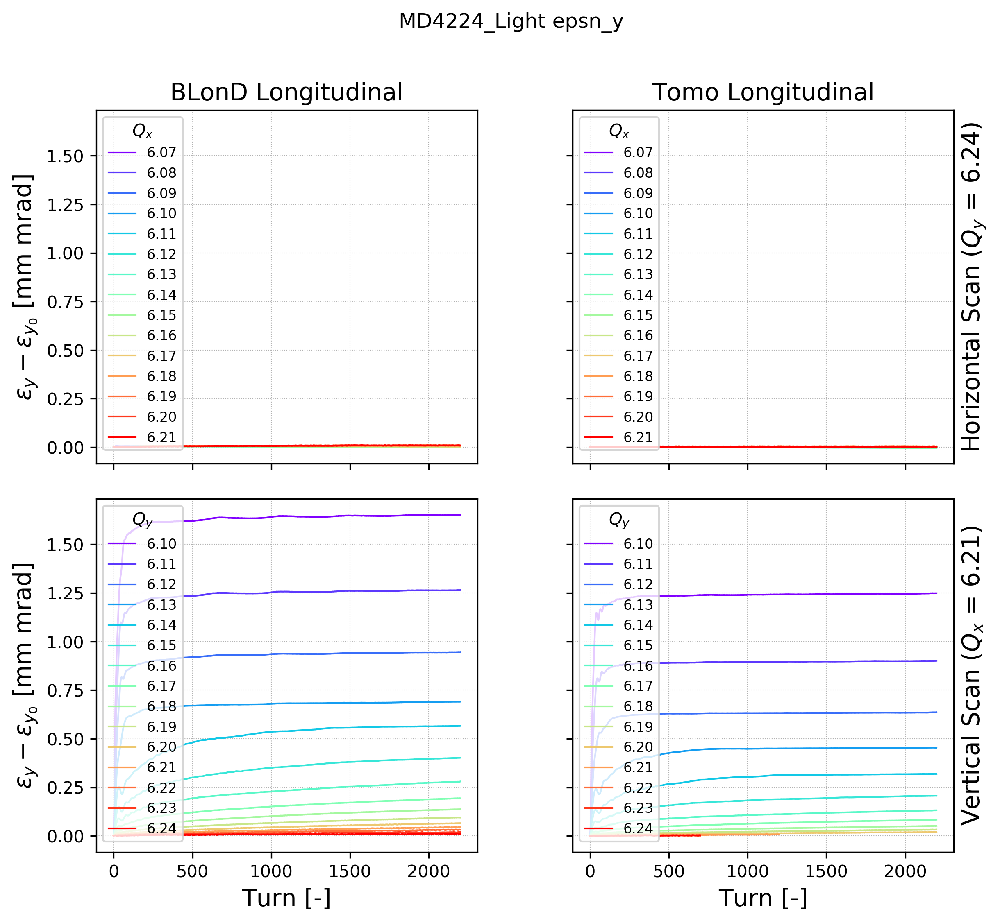

In [31]:
full_labels = True
range_unit = 'mm mrad'
round_sig_limit = 2

parameter = 'epsn_y'
multi1 = 1E6

plt.rcParams['figure.figsize'] = [9.0, 8.0]
hspace = 0.1
vspace = 0.25

fig, axs = plt.subplots(2, 2, sharex='col', sharey='row', gridspec_kw={'hspace':hspace, 'wspace':vspace})
(ax1, ax2), (ax3, ax4) = axs

tit = main_label + ' ' + parameter
fig.suptitle(tit)

ax1.set_ylabel(r'$\epsilon_y-\epsilon_{y_0}$ [mm mrad]');
ax3.set_ylabel(r'$\epsilon_y-\epsilon_{y_0}$ [mm mrad]');
ax3.set_xlabel('Turn [-]');
ax4.set_xlabel('Turn [-]');


colors = cm.rainbow(np.linspace(0, 1, len(dd1.keys())))
c_it = int(0)
for key, value in sorted(dd1.iteritems()):
        ax1.plot(dd1[key]['turn'][0], ((dd1[key][parameter][0]*multi1)-(dd1[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);
        av_ = np.mean(dd1[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd1[key][parameter][0]*multi1) - np.min(dd1[key][parameter][0]*multi1))
        print title_2, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'
        c_it = c_it + 1;       

ax1.grid(lw=0.5, ls=':');

colors = cm.rainbow(np.linspace(0, 1, len(dd2.keys())))
c_it = int(0)
for key, value in sorted(dd2.iteritems()):
        ax2.plot(dd2[key]['turn'][0], ((dd2[key][parameter][0]*multi1)-(dd2[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);  
        av_ = np.mean(dd2[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd2[key][parameter][0]*multi1) - np.min(dd2[key][parameter][0]*multi1))
        print title_1, ' ', case_label_1, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'        
        c_it = c_it + 1;        
ax2.grid(lw=0.5, ls=':');
ax2.set_title(title_1)

colors = cm.rainbow(np.linspace(0, 1, len(dd3.keys())))
c_it = int(0)
for key, value in sorted(dd3.iteritems()):
        ax3.plot(dd3[key]['turn'][0], ((dd3[key][parameter][0]*multi1)-(dd3[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);
        av_ = np.mean(dd3[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd3[key][parameter][0]*multi1) - np.min(dd3[key][parameter][0]*multi1))
        print title_2, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'        
        c_it = c_it + 1;
ax3.grid(lw=0.5, ls=':');
ax1.set_title(title_2)

colors = cm.rainbow(np.linspace(0, 1, len(dd4.keys())))
c_it = int(0)
for key, value in sorted(dd4.iteritems()):
        ax4.plot(dd4[key]['turn'][0], ((dd4[key][parameter][0]*multi1)-(dd4[key][parameter][0][0]*multi1)), label=key, color=colors[c_it]);
        av_ = np.mean(dd4[key][parameter][0][-100]*multi1)
        rang_ = np.abs(np.max(dd4[key][parameter][0]*multi1) - np.min(dd4[key][parameter][0]*multi1))
        print title_1, ' ', case_label_2, ' ', key, 'Average ', parameter, ' = ' , \
        str(round_sig(av_)), ' range = ', round_sig(rang_), ' = ', round_sig(rang_/av_)*100, '%'        
        c_it = c_it + 1;
ax4.grid(lw=0.5, ls=':');

if full_labels:
    ax1.legend(loc=2, title=legend_label1);
    ax2.legend(loc=2, title=legend_label1);
    ax3.legend(loc=2, title=legend_label2);
    ax4.legend(loc=2, title=legend_label2);
else:    
    ax1.legend(loc=2, title=legend_label1, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));
    ax3.legend(loc=2, title=legend_label2, framealpha = 1.0, bbox_to_anchor=(0.99, 1.0));    

ax1.set_ylim(ax3.get_ylim()) #force lower 2 plots to have same limits as upper
ax5 = ax2.twinx()
ax5.set_ylabel(case_label_1);
ax6 = ax4.twinx()
ax6.set_ylabel(case_label_2);
ax5.set_yticklabels([]);
ax6.set_yticklabels([]);
ax5.set_yticks([]);
ax6.set_yticks([]);


for ax in axs.flat:
    ax.label_outer()   
    
savename = save_folder +'/' + main_label + '_' + parameter + '_growth_cf.png'
plt.savefig(savename, dpi = 800);